In [1]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as Dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import pickle
from torch.utils.data import Subset
manualSeed = 999
random.seed(manualSeed)
torch.manual_seed(manualSeed)

In [2]:
device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
lr = 0.0002
batch_size = 64
image_size = 64
image_channels = 3
num_classes = 10 
embed_size = 100
z_dim = 100  
epochs = 50
disc_features = 64  
gen_features = 64  

### Downloading Images

In [3]:
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])
train_Dataset = Dataset.CIFAR10('./data', download=True, train=True, transform=transform)
test_Dataset = Dataset.CIFAR10('./data', download=True, train=False, transform=transform)
train_Dataset = train_Dataset+test_Dataset
train_Dataloader = torch.utils.data.DataLoader(train_Dataset, shuffle=True, batch_size=batch_size)

Files already downloaded and verified
Files already downloaded and verified


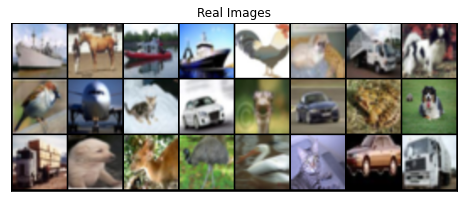

In [4]:
def display_images(images, title, figsize=(8,8), nrow=8):
    images = vutils.make_grid(images, nrow, normalize=True)
    images = images.numpy()
    plt.figure(figsize=figsize)
    plt.imshow(np.transpose(images, (1,2,0)))
    plt.xticks([])
    plt.yticks([])
    plt.title(title)
    plt.show()

images, labels = next(iter(train_Dataloader))
display_images(images[:24], 'Real Images')

### Generator Model

In [5]:
class Generator_Model(nn.Module):
    def __init__(self, num_classes, img_size, embed_size):
        super(Generator_Model, self).__init__()
        self.image_size = img_size
        self.net = nn.Sequential(
            nn.ConvTranspose2d(z_dim + embed_size, gen_features*16, 4, 1, 0, bias=False),
            self._block(gen_features*16, gen_features*8, 4, 2, 1),
            self._block(gen_features*8, gen_features*4, 4, 2, 1),
            self._block(gen_features*4, gen_features*2, 4, 2, 1),
            nn.ConvTranspose2d(gen_features*2, image_channels, 4, 2, 1),
            nn.Tanh())
        self.embed = nn.Embedding(num_classes, embed_size)

    def _block(self, in_channels, out_channels, kernel, stride, padding):
        return nn.Sequential(nn.ConvTranspose2d(in_channels, out_channels, kernel, stride, padding, bias=False),
                             nn.BatchNorm2d(out_channels),
                             nn.ReLU())

    def forward(self, z, labels):
        embedding = self.embed(labels).unsqueeze(2).unsqueeze(3)
        z = torch.cat([z, embedding], dim=1)
        return self.net(z)

### Discriminator Model

In [6]:
class Discriminator_Model(nn.Module):
    def __init__(self, num_classes, img_size):
        super(Discriminator_Model, self).__init__()
        self.img_size = img_size
        self.net = nn.Sequential(
            nn.Conv2d(image_channels, disc_features, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),                       
            self._block(disc_features, disc_features*2, 4, 2, 1),     
            self._block(disc_features*2, disc_features*4, 4, 2, 1),  
            self._block(disc_features*4, disc_features*8, 4, 2, 1),
        )
        
        self.embed = nn.Embedding(num_classes, img_size*img_size)
        self.validity_layer = nn.Sequential(nn.Conv2d(512,1,4,1,0,bias = False),nn.Sigmoid())
        self.labels = nn.Sequential(nn.Conv2d(512, 11, 4, 1, 0, bias = False), nn.LogSoftmax(dim = 1)
        )
        
        
    def _block(self, in_channels, out_channels, kernel, stride, padding):
        return nn.Sequential(nn.Conv2d(in_channels, out_channels, kernel, stride, padding, bias=False),
                             nn.BatchNorm2d(out_channels),
                             nn.LeakyReLU(0.2),
                            )
    
    def forward(self, x):
        x= self.net(x)
        validity = self.validity_layer(x).view(-1)
        label = self.labels(x).view(-1, 11)
        return validity, label

In [7]:
def initialize_weights(M):
    classname = M.__class__.__name__
    if classname.find('Conv') != -1:
        M.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        M.weight.data.normal_(1.0, 0.02)
        M.bias.data.fill_(0)
                       
Disc_Model =Discriminator_Model(num_classes, image_size).to(device)
Gen_Model = Generator_Model(num_classes, image_size, embed_size).to(device)
Disc_Model.apply(initialize_weights)
Gen_Model.apply(initialize_weights)
criterion = nn.BCELoss()
Disc_optim = optim.Adam(Disc_Model.parameters(), lr=lr, betas=(0.5, 0.999))
Gen_optim = optim.Adam(Gen_Model.parameters(), lr=lr, betas=(0.5, 0.999))

[5/50]   DISCRIMINATOR_LOSS:2.189504623413086   GENERATOR_LOSS:12.811171531677246


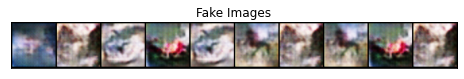

[10/50]   DISCRIMINATOR_LOSS:0.6577758193016052   GENERATOR_LOSS:10.742218017578125


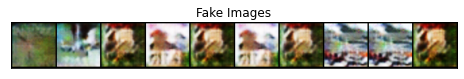

[15/50]   DISCRIMINATOR_LOSS:0.5014408230781555   GENERATOR_LOSS:13.707006454467773


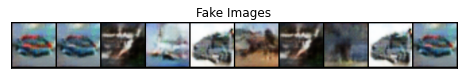

[20/50]   DISCRIMINATOR_LOSS:0.5029541850090027   GENERATOR_LOSS:16.461963653564453


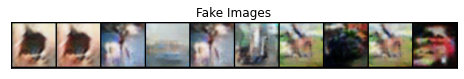

[25/50]   DISCRIMINATOR_LOSS:0.462861031293869   GENERATOR_LOSS:5.542230606079102


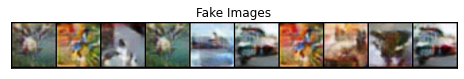

[30/50]   DISCRIMINATOR_LOSS:0.41294047236442566   GENERATOR_LOSS:10.412871360778809


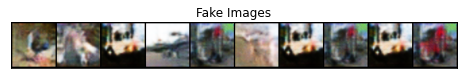

[35/50]   DISCRIMINATOR_LOSS:0.295043021440506   GENERATOR_LOSS:19.191593170166016


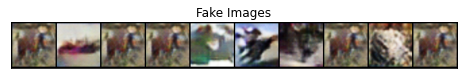

[40/50]   DISCRIMINATOR_LOSS:0.2357545793056488   GENERATOR_LOSS:16.08685302734375


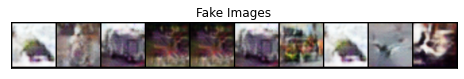

[45/50]   DISCRIMINATOR_LOSS:1.5999088287353516   GENERATOR_LOSS:9.662580490112305


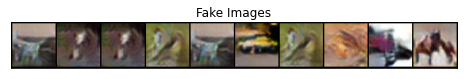

[50/50]   DISCRIMINATOR_LOSS:0.34524673223495483   GENERATOR_LOSS:11.590402603149414


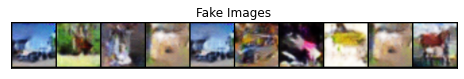

In [8]:
img_list = []
GEN_LOSS = []
DISC_LOSS = []
FID_score = []

for epoch in range(1,epochs+1):
    Disc_Model.train()
    Gen_Model.train()
    for i, (images, labels) in enumerate(train_Dataloader):
        images = images.to(device)
        img_labels = labels.to(device)
              
        mb_size = images.size(0)
        fake_class_labels = 10*torch.ones((mb_size,),dtype = torch.long,device = device)
        
        #TRAIN DISCRIMINATOR
     
        Disc_optim.zero_grad()    

        #TRAIN WITH REAL IMAGES
        
        val_label = torch.full((mb_size,), 1.0, dtype=torch.float).to(device)
        Disc_real, Disc_label = Disc_Model(images)
        Disc_RealVal_Loss = criterion(Disc_real, val_label) 
        Disc_RealLabel_Loss = F.nll_loss(Disc_label, img_labels)
        Disc_Real_Loss = Disc_RealVal_Loss + Disc_RealLabel_Loss
        Disc_Real_Loss.backward()

        #TRAIN WITH FAKE IMAGES
        
        samplelabels = torch.randint(0, 10, (mb_size,), dtype = torch.long, device = device)
        noise = torch.randn(mb_size, z_dim, 1, 1).to(device)
        fake = Gen_Model(noise, samplelabels)
        Disc_fake,  Disc_label= Disc_Model(fake.detach())
        val_label.fill_(0.0)
        Disc_fakeVal_Loss = criterion(Disc_fake, val_label) 
        Disc_FakelLabel_Loss = F.nll_loss(Disc_label, fake_class_labels)
        Disc_Fake_Loss = Disc_fakeVal_Loss + Disc_FakelLabel_Loss
        Disc_Fake_Loss.backward()
        disc_Loss = (Disc_Real_Loss + Disc_Fake_Loss) / 2
        Disc_optim.step()

        #TRAIN GENERATOR

        Gen_optim.zero_grad()
        noise = torch.randn(mb_size, z_dim, 1, 1).to(device)
        sample_labels = torch.randint(0,10,(mb_size,),device = device, dtype = torch.long)
        val_label.fill_(1.0)
        fake = Gen_Model(noise, sample_labels)
        output, output_label = Disc_Model(fake)
        
        #CALCULATING GENERATOR'S LOSS
        
        Gen_Val_Loss = criterion(output, val_label) 
        Gen_Label_Loss = F.nll_loss(output_label, sample_labels)
        gen_Loss = Gen_Val_Loss + Gen_Label_Loss
        gen_Loss.backward()
        
        #UPDATE GENERATOR'S PARAMETERS
        
        Gen_optim.step()
        GEN_LOSS.append(gen_Loss.item())
        DISC_LOSS.append(disc_Loss.item())

    with torch.no_grad():
        Gen_Model.eval()
        Gen_images = Gen_Model(noise, sample_labels).detach()
    img_list.append(vutils.make_grid(Gen_images, padding=2, normalize=True))
    
    vutils.save_image(images.cpu(),'IMAGE_DATA/ACGAN_IMAGES/real/image{}.png'.format(epoch), nrow=10, normalize=True)
    vutils.save_image(Gen_images.cpu(),'IMAGE_DATA/ACGAN_IMAGES/fake/image{}.png'.format(epoch), nrow=10, normalize=True)
    
    if epoch%5 == 0:
        print(f'[{epoch}/{epochs}]   DISCRIMINATOR_LOSS:{disc_Loss.item()}   GENERATOR_LOSS:{gen_Loss.item()}') 
        display_images(Gen_images[:10].cpu(), 'Fake Images', figsize=(8,8), nrow=10)
        
vutils.save_image(Gen_images[:10].cpu(),'IMAGE_DATA/acganimage10.png', nrow=10)
vutils.save_image(Gen_images[:24].cpu(),'IMAGE_DATA/acganimage.png')
vutils.save_image(Gen_images[:10].cpu(),'IMAGE_DATA/acganimage10norm.png', nrow=10, normalize=True)
vutils.save_image(Gen_images[:24].cpu(),'IMAGE_DATA/acganimagenorm.png', normalize=True)
torch.save(Gen_Model,'Models/acgan.pth')  

losses = {'GenLoss': GEN_LOSS,
         'DiscLoss': DISC_LOSS}
with open('pickle/acgan_loss.txt', 'wb') as f:
    pickle.dump(losses,f)

#SAVING GENERATED IMAGES FOR VISUALIZATION

with open('pickle/acganImg.txt', 'wb') as f:
    pickle.dump(img_list,f)

### Plotting the Loss

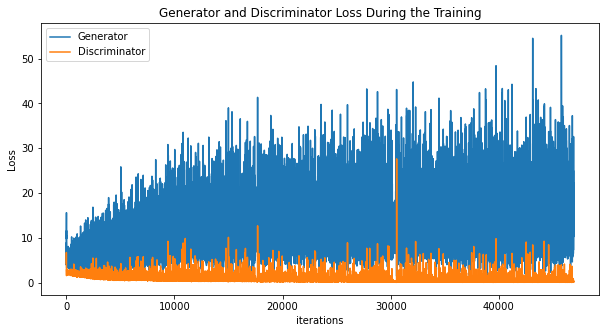

In [9]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During the Training")
plt.plot(GEN_LOSS,label="Generator")
plt.plot(DISC_LOSS,label="Discriminator")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

### Computing the FID Scores

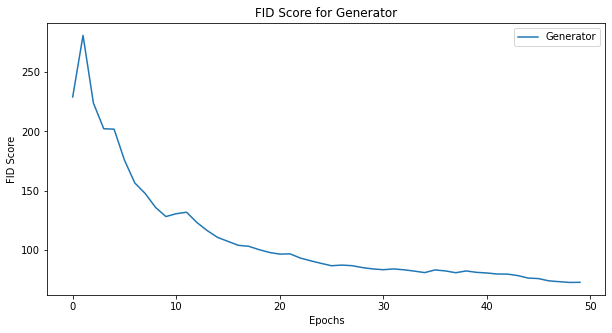

In [3]:
from FID import fidScore
import warnings
warnings.filterwarnings("ignore")

ACGAN_FID = []
for k in range(50):
    k = k+1
    FIDS = fidScore('IMAGE_DATA/ACGAN_IMAGES/real', 'IMAGE_DATA/ACGAN_IMAGES/fake',k,64)
    print(f'Epoch:{k} and FID Score: {FIDS}', end = '\r', flush=True)
    ACGAN_FID.append(FIDS)

with open('pickle/acganfid.txt', 'wb') as f:
    pickle.dump(ACGAN_FID,f)
    
plt.figure(figsize=(10,5))
plt.title("FID Score for Generator")
plt.plot(ACGAN_FID,label="Generator")
plt.xlabel("Epochs")
plt.ylabel("FID Score")
plt.legend()
plt.show()

### Visualizing animation of the images generated at every epoch

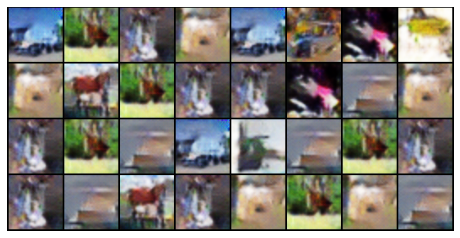

In [4]:
with open('pickle/acganImg.txt', 'rb') as f:
    image_list = pickle.load(f)

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i.cpu(),(1,2,0)), animated=True)] for i in image_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

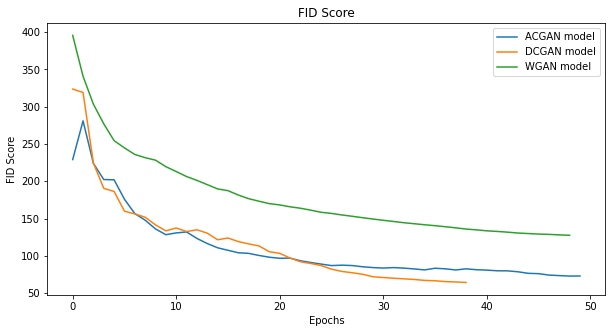

In [5]:
import pickle
import matplotlib.pyplot as plt

wgan_FID = []
dcgan_FID = []
acgan_FID = []

with open('pickle/wganfid.txt', 'rb') as f:
    wgan_FID = pickle.load(f)
    
with open('pickle/dcganfid.txt', 'rb') as f:
    dcgan_FID = pickle.load(f)
    
with open('pickle/acganfid.txt', 'rb') as f:
    acgan_FID = pickle.load(f)
    
plt.figure(figsize=(10,5))
plt.title("FID Score")
plt.plot(acgan_FID,label="ACGAN model")
plt.plot(dcgan_FID,label="DCGAN model")
plt.plot(wgan_FID,label="WGAN model")
plt.xlabel("Epochs")
plt.ylabel("FID Score")
plt.legend()
plt.show()